<a href="https://colab.research.google.com/github/tensorvijay/Mtechcen/blob/master/Random_Forest_Creditcard_Fraud.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import average_precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
import scipy.stats
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:


df=pd.read_csv('/content/drive/MyDrive/Fraud.csv')
df = df.replace(to_replace={'PAYMENT':1,'TRANSFER':2,'CASH_OUT':3,
                                            'CASH_IN':4,'DEBIT':5,'No':0,'Yes':1})
df.drop(['nameOrig','nameDest','isFlaggedFraud'],axis=1,inplace=True)


In [ ]:
df.sample(4)

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
1814542,163,4,131783.46,1544963.45,1676746.92,4624925.7,4493142.24,0
3643655,275,3,86656.57,402013.00,315356.43,0.0,86656.57,0
6015227,451,3,184559.81,82705.00,0.00,3079590.5,3264150.31,0
1915608,166,3,63102.08,12497.00,0.00,0.0,63102.08,0


In [ ]:
y = df[['isFraud']]
X = df.drop(['isFraud'],axis=1)


In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.2, random_state = 121)

In [ ]:
clf = RandomForestClassifier(n_estimators=50,criterion="entropy",max_depth=10,min_samples_leaf=5)

In [ ]:
if True:
    probabilities = clf.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
if True:
    print(average_precision_score(test_y,probabilities))

0.7154750639146131


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
import numpy as np


print(recall_score(test_y,probabilities, average='macro'))

0.860777662661556


In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
print(accuracy_score(test_y,probabilities))

0.9996220110583376


In [ ]:
clf1 = RandomForestClassifier()

In [ ]:
if True:
    probabilities = clf1.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
if True:
    print(average_precision_score(test_y,probabilities))

0.7654222817166213


In [ ]:
print(recall_score(test_y,probabilities, average='macro'))

0.8903922206733668


In [ ]:
print(accuracy_score(test_y,probabilities))

0.9996880216011643


Let us reduce the number of estimators

In [ ]:
clf1 = RandomForestClassifier(n_estimators=10,criterion="entropy",max_depth=10,min_samples_leaf=5)


In [ ]:
if True:
    probabilities = clf1.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
if True:
    print(average_precision_score(test_y,probabilities))
    print(recall_score(test_y,probabilities, average='macro'))
    print(accuracy_score(test_y,probabilities))

0.6929567392759193
0.8480426630458983
0.9995921491461065


The ideal number of estimators is around 15, 10 gives you less precision and recall. However, there is an slight increase in accuracy when the estimator size is reduced and deotg and minimum number of samples are adjusted. Further fine tuning will be interesting.


In [ ]:
if True:
    probabilitiest = clf1.fit(train_X, train_y.values.ravel()).predict(train_X)

In [ ]:
probabilitiest.predict(train_X)

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
if True:
    print(average_precision_score(train_y,probabilitiest))
    print(recall_score(train_y,probabilitiest, average='macro'))
    print(accuracy_score(train_y,probabilitiest))

0.7431942749256791
0.8740196443998027
0.9996703402057643


Here wer are comparing the performance between the training and the test data set, and we can see that the difference between the raining results and the test results are not particularly high. THis shows that there isn't much overfitting. However, it is highly likely that there is some undefitting since both training and test values are close together, so this is a case of underfitting.

In [ ]:
clf15 = RandomForestClassifier(n_estimators=15)



In [ ]:

    probabilities15 = clf15.fit(train_X, train_y.values.ravel()).predict(test_X)




These are the results for the training data.

In [ ]:
  print(average_precision_score(test_y,probabilities15))
  print(recall_score(test_y,probabilities15, average='macro'))
  print(accuracy_score(test_y,probabilities15))

0.763744863422387
0.890686855436983
0.9996856640817776


In [ ]:
probabilities15t = clf15.fit(train_X, train_y.values.ravel()).predict(train_X)

In [ ]:
  print(average_precision_score(train_y,probabilities15t))
  print(recall_score(train_y,probabilities15t, average='macro'))
  print(accuracy_score(train_y,probabilities15t))

0.98484673816048
0.9925668530963148
0.99998055046506


This is a case of overfitting, where the training model has high variance. The training parameters need to be changed to reduce overfitting. So the previous result with n=10 parameters is a much better option than a highly overfitting model.

In [ ]:
clf12 = RandomForestClassifier(n_estimators=12)

probabilities12 = clf15.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
  print(average_precision_score(test_y,probabilities12))
  print(recall_score(test_y,probabilities12, average='macro'))
  print(accuracy_score(test_y,probabilities12))

0.7692047292921947
0.8948318076592758
0.9996927366399376


In [ ]:
probabilities12 = clf12.fit(train_X, train_y.values.ravel()).predict(train_X)

In [ ]:
  print(average_precision_score(train_y,probabilities12))
  print(recall_score(train_y,probabilities12, average='macro'))
  print(accuracy_score(train_y,probabilities12))

0.9761224293704273
0.9881225070079275
0.9999693522479733


Data Analysis

In [ ]:
df.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
0,1,1,9839.64,170136.0,160296.36,0.0,0.0,0
1,1,1,1864.28,21249.0,19384.72,0.0,0.0,0
2,1,2,181.00,181.0,0.00,0.0,0.0,1
3,1,3,181.00,181.0,0.00,21182.0,0.0,1
4,1,1,11668.14,41554.0,29885.86,0.0,0.0,0


From the data analysis in

In [ ]:
scipy.stats.pearsonr(df.iloc[:,3],df.iloc[:,4] )

PearsonRResult(statistic=0.9988027631729837, pvalue=0.0)

From above it is clear that the oldbalanceOrg and NewbalanceOrig are highly correlated. For highly correlated data pearson correlation coefficient is 1, this data is highly correlated.

In [ ]:
scipy.stats.pearsonr(df.iloc[:,3],df.iloc[:,5] )

PearsonRResult(statistic=-0.020403492367990984, pvalue=7.526433468566388e-253)

In [ ]:
scipy.stats.pearsonr(df.iloc[:,6],df.iloc[:,5] )

PearsonRResult(statistic=0.9700604740242301, pvalue=0.0)

IN additon oldbalacneDest and new balance dest are also showing high correlation

However, other combinations show very little correlation

Amount and

Text(0, 0.5, 'Fraud')

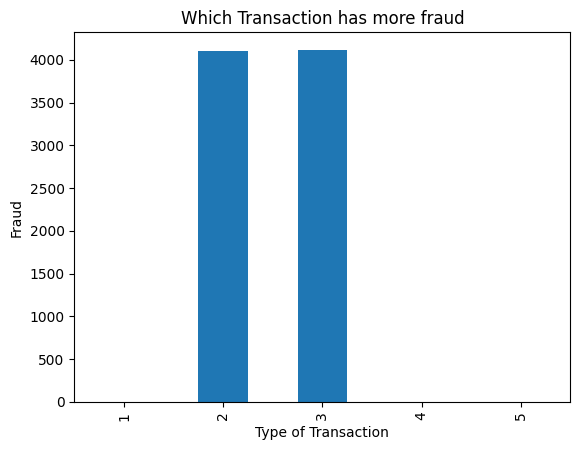

In [ ]:
var = df.groupby('type').isFraud.sum()
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
var.plot(kind='bar')
ax1.set_title("Which Transaction has more fraud")
ax1.set_xlabel('Type of Transaction')
ax1.set_ylabel('Fraud')

{'PAYMENT':1,'TRANSFER':2,'CASH_OUT':3,'CASH_IN':4,'DEBIT':5}

It is clear that the Fraudulent transactions are among the Transfer and Cash out transactions. Only two types of transactions are fraudulent

In [ ]:
df2=df.copy()

Removing all those contributions which do not contribute to a fraud

In [ ]:
df = df.drop(df[df['type'] == 1].index)
df = df.drop(df[df['type'] == 4].index)
df = df.drop(df[df['type'] == 5].index)

In [ ]:
df.sample(5)

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
5774894,400,2,307161.86,0.0,0.0,974551.18,1281713.04,0
1059852,119,2,2495.37,0.0,0.0,810922.40,813417.77,0
1126821,131,2,507953.32,0.0,0.0,2190855.92,2728658.94,0
2680670,210,3,147178.76,27590.0,0.0,190691.71,337870.47,0
3240962,250,3,168555.07,0.0,0.0,378995.71,547550.78,0


In [ ]:
new=df.iloc[:,3]+df.iloc[:,4]

In [ ]:
df2=df.copy()

In [ ]:
df2.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
2,1,2,181.00,181.0,0.0,0.0,0.00,1
3,1,3,181.00,181.0,0.0,21182.0,0.00,1
15,1,3,229133.94,15325.0,0.0,5083.0,51513.44,0
19,1,2,215310.30,705.0,0.0,22425.0,0.00,0
24,1,2,311685.89,10835.0,0.0,6267.0,2719172.89,0


In [ ]:
df2['oldbalanceOrg']=(df2['oldbalanceOrg']+df2['newbalanceOrig'])/2

In [ ]:
df2.head()

,step,type,amount,oldbalanceOrg,newbalanceOrig,oldbalanceDest,newbalanceDest,isFraud
2,1,2,181.00,90.5,0.0,0.0,0.00,1
3,1,3,181.00,90.5,0.0,21182.0,0.00,1
15,1,3,229133.94,7662.5,0.0,5083.0,51513.44,0
19,1,2,215310.30,352.5,0.0,22425.0,0.00,0
24,1,2,311685.89,5417.5,0.0,6267.0,2719172.89,0


In [ ]:
df2.drop(['newbalanceOrig'],axis=1,inplace=True)

In [ ]:
df2.head()

,step,type,amount,oldbalanceOrg,oldbalanceDest,newbalanceDest,isFraud
2,1,2,181.00,90.5,0.0,0.00,1
3,1,3,181.00,90.5,21182.0,0.00,1
15,1,3,229133.94,7662.5,5083.0,51513.44,0
19,1,2,215310.30,352.5,22425.0,0.00,0
24,1,2,311685.89,5417.5,6267.0,2719172.89,0


We are averaging all the correlated values and removing the redundant ones

In [ ]:
df2['oldbalanceDest']=(df2['oldbalanceDest']+df2['newbalanceDest'])/2

In [ ]:
df2.head()

,type,amount,oldbalanceOrg,oldbalanceDest,isFraud
2,2,181.00,90.5,0.000,1
3,3,181.00,90.5,10591.000,1
15,3,229133.94,7662.5,28298.220,0
19,2,215310.30,352.5,11212.500,0
24,2,311685.89,5417.5,1362719.945,0


In [ ]:
df2.drop(['newbalanceDest'],axis=1,inplace=True)

Actually step is also logically unnecassary

In [ ]:
df2.drop(['step'],axis=1,inplace=True)

In [ ]:
y = df2[['isFraud']]
X = df2.drop(['isFraud'],axis=1)

In [ ]:
train_X, test_X, train_y, test_y = train_test_split(X, y, test_size = 0.2, random_state = 121)

We will now apply the lessons learn't from our previous experiments on the raw data

In [ ]:
clf1 = RandomForestClassifier(n_estimators=10)

In [ ]:
probabilities = clf1.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
    print(average_precision_score(test_y,probabilities))
    print(recall_score(test_y,probabilities, average='macro'))
    print(accuracy_score(test_y,probabilities))

0.7256710801241542
0.8768268835457358
0.9992004793514317


The results are similar to the ones we applied to the raw data earlier. However, there is a slight improvement and more importantly, computational time is reduced to a considerable extent. So clearly, we have removed unncessary data. Ths is our final result

In [ ]:
probabilitiest = clf1.fit(train_X, train_y.values.ravel()).predict(train_X)

In [ ]:
    print(average_precision_score(train_y,probabilitiest))
    print(recall_score(train_y,probabilitiest, average='macro'))
    print(accuracy_score(train_y,probabilitiest))

0.9547410553377302
0.9776808174915346
0.9998646409126452


Now we are suffering from a problem of only slight overfitting, in the case of precision, However, in the case of recall the difference between the training and test case is moderate and indicated ambient training (neither overfitting nor underfitting). It is clear that over data cleanup of removing redundant and unncecarry information has impvoed Machine learnign performance to a great extent. Perhaps with further tuning, we can improve the performance!

1. Data cleaning including missing values, outliers and multi-collinearity.

Missing Values: There were no missing values or 'Nan' hence data cleaning did not take much of an effort. However, we have removed redundant columns: 'step' and 'IsFlaggedFraud'.

Outliers: As indicated by the graph above, only 'Tranfer' abd 'Cash out' has contributes to fraud, so we are removing all other types. This contributes to improvement in machine learning parameters and keep the overall process cogent.

Multicollinearity: The balance transfer columns have shown considerable correlation as we have seen through the Pearson correlation coefficient. We are averaging them and eliminating the redundant column. This has demonstrated computational efficiency and has evidenced some positive changes in training parameters.

2. Describe your fraud detection model in elaboration.

We use the Random forests ML algorithm, they are ensemble decision trees which use multitude of descision trees during the training phase, they deal with the overfitting charactersistics of basic decision trees. They create a multitude of descision trees and select the descisions through voting.

We are using a random forest algorithm to detect fraud. Random forest algorithms are good with data with unbalanced data. There are many zeros in the data. After several trails and errors of both the input parameters in like number of estimators and error detection index, we have obtained good results with respect to minimal overfitting. We are using a total of 10 estimators. The difference between evaluation metrics on the training data and test data is minimal when we use around 10 estimators. We observe the performance metrics: precision, recall and accuracy are better when we use 'cleaned' data rather than the raw data. However, we note high metric values for training data, which can possible indicate overfitting.

The interesting feature of this algorithm is that the cleaned data is responding much more positively with minimal difference between the train metrics and test metrics for accuracy and Recall. But for precision there is slightly higher difference. We dealt with multicollinearity through averaging, removed the redundant columns and chose the rows wit Transfer and Cash out alsone since they are the only ones that involve fraud.

3. How did you select variables to be included in the model?

The variables where choosen on the basis of relevance with respect to fraud. We also used basis common sense. This realizaiton happened after working with the raw data. The computational time for Random Forest was very high, this was unnecessary, so, we removed the step, IsFlaggedFraud is a rule based model so is unndecessary. Columns for source and destination for money were highly correlated with each other, so we averaged them to single columns. Types of transactions which wre not relevant to the fraud are excluded.

4. Demonstrate the performance of the model by using best set of tools.

Accuracy, Precision and Recall are the performance tools that we have choosen. We have proactively carried out several experiments on the Raw data. Although the resuslts are in general not very different for the raw and the cleaned data, overfitting and underfitting are much lesser with the cleaned up data. We find that the difference in recall for test and train prediction involves optimal value. While the difference is slightly higher for the precision. However, high evaluation metrics for training data may possible indicate overfitting.

5. What are the key factors that predict fraudulent customer?

Transfer and Cash out are the modes in which Fraud takes place. Authorities have to be careful with these transactions. Fraud are anomalous transactions that take place. We have demonstrated very clearly as well as it is well published that Random Forests are the best machine Learning algorithms available. Since Random Forests are highly successful, Fraudulent transaction has a highly non linear nature. This means that it is not easy to detect. Random Forests are known to fail when the data contains considerable number of outliers. Frauds are implicit in the data set. The non linear yet implicit nature of frauds, help random forests predict the fradulent customer.


6. Do these factors make sense? If yes, How? If not, How not?

These factors make sense if the fraudulent activities are unorganized crimes: hence th non linearity. If it is a syndicate that involves in this crime then there will be a well established pattern and there would be considerable linearity in the data. If the crime is not organized this data does not make sense, if it is unorganized, then it makes a lot of sense. ALso the threat is not internal (Bank Employees), there would have been some linear pattern.

What kind of prevention should be adopted while company update its infrastructure?

Since it is clear that there is no established explicit pattern, the best way is to reduce Transfer and Cash out transactions. Debit transactions have not shown much fraud. The key is to establish a pattern, that will take us to the source. Pattern can be established if Banks in crease the documentation in every transaction, more information is needed for better data analysis

Assuming these actions have been implemented, how would you determine if they work?

If the measures are working, Fraud will leave a detectable trail, a distinct pattern at least if not linearity

In [ ]:
1+1

2

In [ ]:
df5=df2.copy()

In [ ]:
df5 = df5.drop(df[df['type'] == 0].index)

Smaller amounts of transaction show more fraud

Text(0, 0.5, 'Oldbalnce')

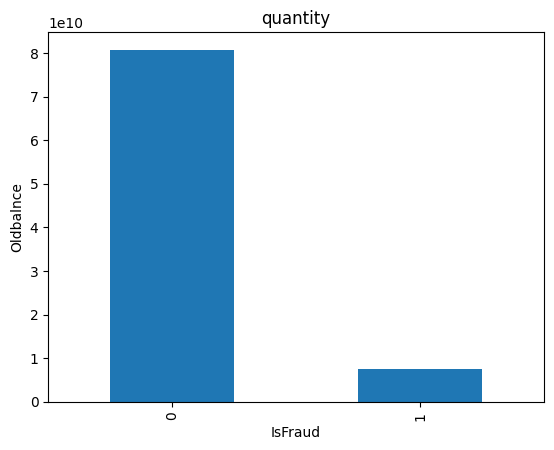

In [ ]:
var = df2.groupby('isFraud').oldbalanceOrg.sum()
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
var.plot(kind='bar')
ax1.set_title("quantity")
ax1.set_xlabel('IsFraud')
ax1.set_ylabel('Oldbalnce')

Text(0, 0.5, 'Oldbalnce')

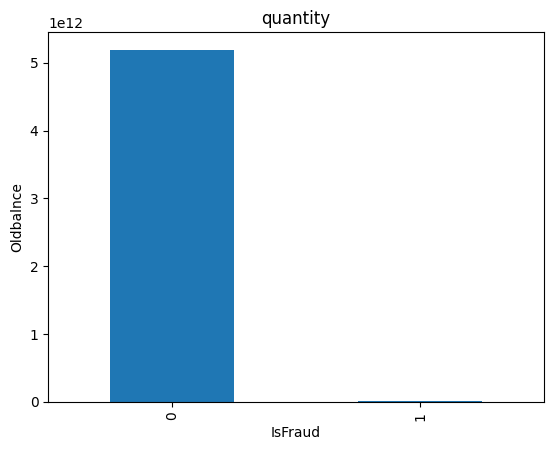

In [ ]:
var = df2.groupby('isFraud').oldbalanceDest.sum()
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
var.plot(kind='bar')
ax1.set_title("quantity")
ax1.set_xlabel('IsFraud')
ax1.set_ylabel('Oldbalnce')

Text(0, 0.5, 'Oldbalnce')

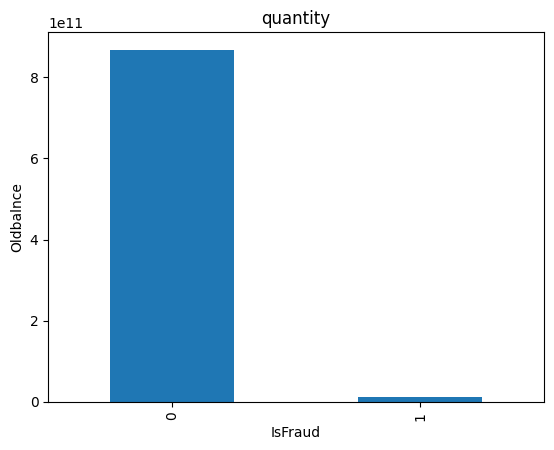

In [ ]:
var = df2.groupby('isFraud').amount.sum()
fig = plt.figure()
ax1 = fig.add_subplot(1,1,1)
var.plot(kind='bar')
ax1.set_title("quantity")
ax1.set_xlabel('IsFraud')
ax1.set_ylabel('Oldbalnce')

In [ ]:
from sklearn.decomposition import PCA


In [ ]:
df2.head()

,type,amount,oldbalanceOrg,oldbalanceDest,isFraud
2,2,181.00,90.5,0.000,1
3,3,181.00,90.5,10591.000,1
15,3,229133.94,7662.5,28298.220,0
19,2,215310.30,352.5,11212.500,0
24,2,311685.89,5417.5,1362719.945,0


In [ ]:
Fraud = df2.groupby(df2[df2['isFraud'] == 1].index)

ValueError: ignored

In [ ]:
df = df.drop(df[df['type'] == 1].index)

In [ ]:
fraud = df2.loc[df2.isFraud == 1]
nonfraud = df2.loc[df2.isFraud == 0]

In [ ]:
fraud.head()

,type,amount,oldbalanceOrg,oldbalanceDest,isFraud
2,2,181.0,90.5,0.0,1
3,3,181.0,90.5,10591.0,1
251,2,2806.0,1403.0,0.0,1
252,3,2806.0,1403.0,13101.0,1
680,2,20128.0,10064.0,0.0,1


In [ ]:
nonfraud.head()

,type,amount,oldbalanceOrg,oldbalanceDest,isFraud
15,3,229133.94,7662.500,28298.220,0
19,2,215310.30,352.500,11212.500,0
24,2,311685.89,5417.500,1362719.945,0
42,3,110414.71,13422.705,145607.580,0
47,3,56953.90,971.010,67179.590,0


In [ ]:
f=fraud.sample(1000)
nf=nonfraud.sample(1000)

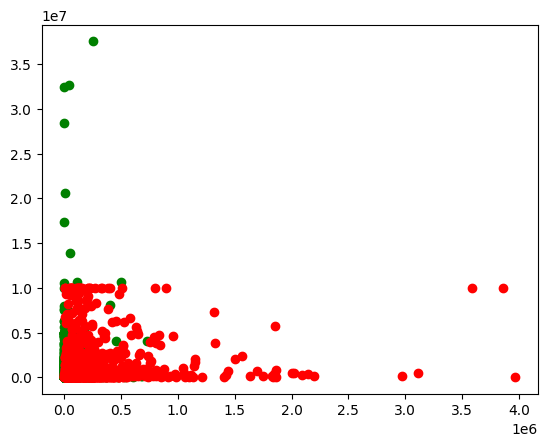

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.scatter(nf['oldbalanceOrg'],f['oldbalanceOrg'],c='g')
ax.scatter(nf['amount'],f['amount'],c='r')
plt.show()

Relationship between fraud amount and non fraud amounts. Shows how largely, the pattern is non linear and invisible. Therefore more doccumentation is necessary to establish more patterns and help with analysis

Lest us try some hyperparameter tuning

In [ ]:
clf1 = RandomForestClassifier(n_estimators=7)

In [ ]:
probabilities = clf1.fit(train_X, train_y.values.ravel()).predict(test_X)

In [ ]:
    print(average_precision_score(test_y,probabilities))
    print(recall_score(test_y,probabilities, average='macro'))
    print(accuracy_score(test_y,probabilities))

0.7205768043616442
0.8802368059448755
0.9991824314812608


In [ ]:
clf1 = RandomForestClassifier(n_estimators=7,max_depth=3)

In [ ]:
clf1.fit(train_X, train_y.values.ravel())

RandomForestClassifier(max_depth=3, n_estimators=7)

In [ ]:
prob=clf1.predict(test_X)

In [ ]:
    print(average_precision_score(test_y,prob))
    print(recall_score(test_y,prob, average='macro'))
    print(accuracy_score(test_y,prob))

0.5614608394916616
0.7873847634686285
0.9987258203659386


Maximum depth has brought the precision down

In [ ]:
estimator = clf1.estimators_[5]

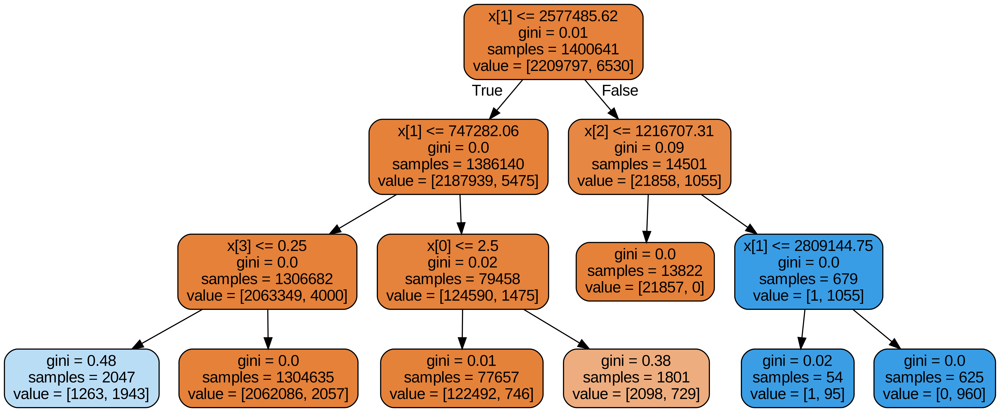

In [ ]:
from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False,
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')

In [ ]:
clf1 = RandomForestClassifier(n_estimators=7,max_depth=10)

In [ ]:
clf1.fit(train_X, train_y.values.ravel())

RandomForestClassifier(max_depth=10, n_estimators=7)

In [ ]:
prob=clf1.predict(test_X)

In [ ]:
    print(average_precision_score(test_y,prob))
    print(recall_score(test_y,prob, average='macro'))
    print(accuracy_score(test_y,prob))

0.676198870171341
0.8416341201124231
0.9990597059640992


In [ ]:
estimator = clf1.estimators_[6]

In [ ]:
export_graphviz(estimator, out_file='tree.dot',
                rounded = True, proportion = False,
                precision = 2, filled = True)

from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

from IPython.display import Image
Image(filename = 'tree.png')